In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import numpy as np
import glob

In [9]:
import json

In [3]:
trains=glob.glob('/Users/mingbin/Desktop/Wankowicz_lab_Mac/Projects/water/data/PDBs_train_local_metrics/*')
tests=glob.glob('/Users/mingbin/Desktop/Wankowicz_lab_Mac/Projects/water/data/PDBs_test_local_metrics/*')

In [28]:
# Convert from file names to json objects.
list_trains, list_tests = [], []
for file in trains:
    with open(file, 'r') as f:
        data = json.load(f)
    list_trains.append(data)

for file in tests:
    with open(file, 'r') as f:
        data = json.load(f)
    list_tests.append(data)

In [30]:
len(list_trains)

4507

In [31]:
list_trains[0]

[{'EDIAm': 0.34715,
  'NGRID': 804,
  'OPIA': 12.5,
  'RSCCS': 0.831856,
  'RSR': 0.128594,
  'SRSR': 0.00644423,
  'asymID': 'A',
  'compID': 'MET',
  'pdb': {'compID': 'MET', 'insCode': '', 'seqNum': 1, 'strandID': 'A'},
  'seqID': 1},
 {'EDIAm': 0.615091,
  'NGRID': 565,
  'OPIA': 50,
  'RSCCS': 0.960479,
  'RSR': 0.0963762,
  'SRSR': 0.00503355,
  'asymID': 'A',
  'compID': 'MET',
  'pdb': {'compID': 'MET', 'insCode': '', 'seqNum': 2, 'strandID': 'A'},
  'seqID': 2},
 {'EDIAm': 0.329847,
  'NGRID': 684,
  'OPIA': 44.4444,
  'RSCCS': 0.919494,
  'RSR': 0.0947188,
  'SRSR': 0.00569471,
  'asymID': 'A',
  'compID': 'GLN',
  'pdb': {'compID': 'GLN', 'insCode': '', 'seqNum': 3, 'strandID': 'A'},
  'seqID': 3},
 {'EDIAm': 0.895761,
  'NGRID': 330,
  'OPIA': 100,
  'RSCCS': 0.987154,
  'RSR': 0.0388721,
  'SRSR': 0.00336628,
  'asymID': 'A',
  'compID': 'PHE',
  'pdb': {'compID': 'PHE', 'insCode': '', 'seqNum': 4, 'strandID': 'A'},
  'seqID': 4},
 {'EDIAm': 0.384602,
  'NGRID': 384,
  'OP

In [4]:
len(trains), len(tests)

(4507, 1293)

In [5]:
trains[0]

'/Users/mingbin/Desktop/Wankowicz_lab_Mac/Projects/water/data/PDBs_train_local_metrics/8e77_stats.txt'

In [8]:
print(trains[0])

/Users/mingbin/Desktop/Wankowicz_lab_Mac/Projects/water/data/PDBs_train_local_metrics/8e77_stats.txt


[{"EDIAm":0.34715,"NGRID":804,"OPIA":12.5,"RSCCS":0.831856,"RSR":0.128594,"SRSR":0.00644423,"asymID":"A","compID":"MET","pdb":{"compID":"MET","insCode":"","seqNum":1,"strandID":"A"},"seqID":1},{"EDIAm":0.615091,"NGRID":565,"OPIA":50,"RSCCS":0.960479,"RSR":0.0963762,"SRSR":0.00503355,"asymID":"A","compID":"MET","pdb":{"compID":"MET","insCode":"","seqNum":2,"strandID":"A"},"seqID":2}...]      
As shown, each txt is a list of dictionaries, with each dictionary for each residue.

In [12]:
# Use json to load the txt file.
with open(trains[0], 'r') as f:
    data = json.load(f)

print(data)


[{'EDIAm': 0.34715, 'NGRID': 804, 'OPIA': 12.5, 'RSCCS': 0.831856, 'RSR': 0.128594, 'SRSR': 0.00644423, 'asymID': 'A', 'compID': 'MET', 'pdb': {'compID': 'MET', 'insCode': '', 'seqNum': 1, 'strandID': 'A'}, 'seqID': 1}, {'EDIAm': 0.615091, 'NGRID': 565, 'OPIA': 50, 'RSCCS': 0.960479, 'RSR': 0.0963762, 'SRSR': 0.00503355, 'asymID': 'A', 'compID': 'MET', 'pdb': {'compID': 'MET', 'insCode': '', 'seqNum': 2, 'strandID': 'A'}, 'seqID': 2}, {'EDIAm': 0.329847, 'NGRID': 684, 'OPIA': 44.4444, 'RSCCS': 0.919494, 'RSR': 0.0947188, 'SRSR': 0.00569471, 'asymID': 'A', 'compID': 'GLN', 'pdb': {'compID': 'GLN', 'insCode': '', 'seqNum': 3, 'strandID': 'A'}, 'seqID': 3}, {'EDIAm': 0.895761, 'NGRID': 330, 'OPIA': 100, 'RSCCS': 0.987154, 'RSR': 0.0388721, 'SRSR': 0.00336628, 'asymID': 'A', 'compID': 'PHE', 'pdb': {'compID': 'PHE', 'insCode': '', 'seqNum': 4, 'strandID': 'A'}, 'seqID': 4}, {'EDIAm': 0.384602, 'NGRID': 384, 'OPIA': 62.5, 'RSCCS': 0.917388, 'RSR': 0.110852, 'SRSR': 0.00527196, 'asymID': 'A'

In [11]:
type(data)

list

In [14]:
print(type(data[0]))
print(data[0])

<class 'dict'>
{'EDIAm': 0.34715, 'NGRID': 804, 'OPIA': 12.5, 'RSCCS': 0.831856, 'RSR': 0.128594, 'SRSR': 0.00644423, 'asymID': 'A', 'compID': 'MET', 'pdb': {'compID': 'MET', 'insCode': '', 'seqNum': 1, 'strandID': 'A'}, 'seqID': 1}


In [22]:
len(data)

966

In [15]:
res_1=data[0]
res_1.keys()

dict_keys(['EDIAm', 'NGRID', 'OPIA', 'RSCCS', 'RSR', 'SRSR', 'asymID', 'compID', 'pdb', 'seqID'])

"compID" is the residue name.

In [17]:
# check the 8e77 information.
df_res=pd.read_pickle('/Users/mingbin/Desktop/Wankowicz_lab_Mac/Projects/water/notebook/df_1_res.pckl')

In [40]:
# check the water number.
df_train_wat=pd.read_pickle('/Users/mingbin/Desktop/Wankowicz_lab_Mac/Projects/water/notebook/df_water_4_train.pkl')

In [24]:
# Only for amino acids.
df_res[df_res.name=='8e77'].res_dict.values[0]

{'chain': ['A'],
 'total_res': [358],
 'residues': [[['MET',
    'MET',
    'GLN',
    'PHE',
    'ILE',
    'ASP',
    'LEU',
    'VAL',
    'ALA',
    'GLN',
    'GLN',
    'ASP',
    'ARG'],
   ['ILE',
    'LYS',
    'ASP',
    'LYS',
    'LEU',
    'ASN',
    'THR',
    'ASN',
    'ILE',
    'GLN',
    'LYS',
    'VAL',
    'LEU'],
   ['ALA',
    'HIS',
    'GLY',
    'GLN',
    'TYR',
    'ILE',
    'LEU',
    'GLY',
    'PRO',
    'GLU',
    'VAL',
    'HIS',
    'GLU'],
   ['LEU',
    'GLU',
    'GLU',
    'LYS',
    'LEU',
    'SER',
    'ALA',
    'TYR',
    'THR',
    'GLY',
    'ALA',
    'LYS',
    'TYR'],
   ['CYS',
    'ILE',
    'THR',
    'CYS',
    'ALA',
    'ASN',
    'GLY',
    'THR',
    'ASP',
    'ALA',
    'LEU',
    'GLN',
    'ILE'],
   ['ALA',
    'GLN',
    'MET',
    'VAL',
    'PHE',
    'GLY',
    'ILE',
    'GLY',
    'PRO',
    'GLY',
    'ASP',
    'GLU',
    'VAL'],
   ['ILE',
    'THR',
    'PRO',
    'GLY',
    'PHE',
    'THR',
    'TYR',
    'ILE'

In [41]:
df_train_wat

,name,structure,b_fac
0,3lez,"{'A': {'seq_id': ['9', '10', '11', '12', '13',...","[[43.75, 60.560001373291016, 36.29999923706055..."
1,7sie,"{'A': {'seq_id': ['801', '802', '803', '804', ...","[[29.579999923706055, 25.299999237060547, 16.1..."
2,6rt3,"{'A': {'seq_id': ['301', '302', '304', '305', ...","[[19.1200008392334, 31.6299991607666, 46.61999..."
3,3qx5,"{'L': {'seq_id': ['1001', '1002', '1003', '100...","[[9.819999694824219, 12.380000114440918, 11.40..."
4,2hph,"{'A': {'seq_id': ['702', '703', '704', '705', ...","[[7.960000038146973, 10.25, 7.730000019073486,..."
...,...,...,...
4502,5l2v,"{'A': {'seq_id': ['501', '502', '503', '504', ...","[[30.440000534057617, 11.75, 28.54000091552734..."
4503,8pb7,"{'A': {'seq_id': ['502', '504', '505', '507', ...","[[40.56999969482422, 31.920000076293945, 20.02..."
4504,6eau,"{'A': {'seq_id': ['401', '402', '404', '408', ...","[[16.899999618530273, 44.41999816894531, 19.03..."
4505,5kxl,"{'A': {'seq_id': ['301', '302', '303', '304', ...","[[8.760000228881836, 13.220000267028809, 34.68..."


In [46]:
all_water=[a for a in df_train_wat.b_fac.values]

In [47]:
all_water

[[[43.75,
   60.560001373291016,
   36.29999923706055,
   50.459999084472656,
   27.81999969482422,
   27.729999542236328,
   31.489999771118164,
   35.970001220703125,
   39.060001373291016,
   44.790000915527344,
   32.83000183105469,
   32.77000045776367,
   37.939998626708984,
   27.549999237060547,
   31.8799991607666,
   42.61000061035156,
   33.880001068115234,
   26.68000030517578,
   25.299999237060547,
   54.18000030517578,
   31.959999084472656,
   16.989999771118164,
   23.489999771118164,
   16.280000686645508,
   16.559999465942383,
   23.149999618530273,
   18.15999984741211,
   25.260000228881836,
   18.65999984741211,
   20.549999237060547,
   44.4900016784668,
   19.329999923706055,
   37.619998931884766,
   65.05000305175781,
   38.349998474121094,
   55.81999969482422,
   59.369998931884766,
   32.380001068115234,
   52.31999969482422,
   33.29999923706055,
   37.4900016784668,
   27.81999969482422,
   31.290000915527344,
   22.959999084472656,
   33.72999954223633,

In [49]:
flat_water=[water for structure in all_water for chain in structure for water in chain]
len(flat_water)

1489982

In [48]:
len(all_water)

4507

In [ ]:
def get_water_local_metrics(filename):
    """Get the local metrics for water residues for single pdb output txt file."""
    with open(f'{filename}.txt', 'r') as f:
        data = json.load(f)
    
    for res in data:
        if res['compID'] in df_res.name.values['HOH', 'WAT', 'H2O']: # Only look for water



In [25]:
local_metric_keys=['EDIAm', 'NGRID', 'OPIA', 'RSCCS', 'RSR', 'SRSR']
# Txt contains ['EDIAm', 'NGRID', 'OPIA', 'RSCCS', 'RSR', 'SRSR', 'asymID', 'compID', 'pdb', 'seqID'] keys.

In [35]:
key='EDIAm'
train_data = [res[key] for structure in list_trains for res in structure if res['compID'] in ['HOH', 'WAT', 'H2O']]

In [38]:
# Number of water molecules for all training structures.
len(train_data)

1510790

In [66]:
# Collect all the data for each key.
keys=['EDIAm','RSCCS', 'RSR']
train_All_dict, test_All_dict = {}, {}
for key in keys:
    train_All_dict[key] = [res[key] for structure in list_trains for res in structure if res['compID'] in ['HOH', 'WAT', 'H2O'] and res[key] is not None]
    test_All_dict[key] = [res[key] for structure in list_tests for res in structure if res['compID'] in ['HOH', 'WAT', 'H2O'] and res[key] is not None]



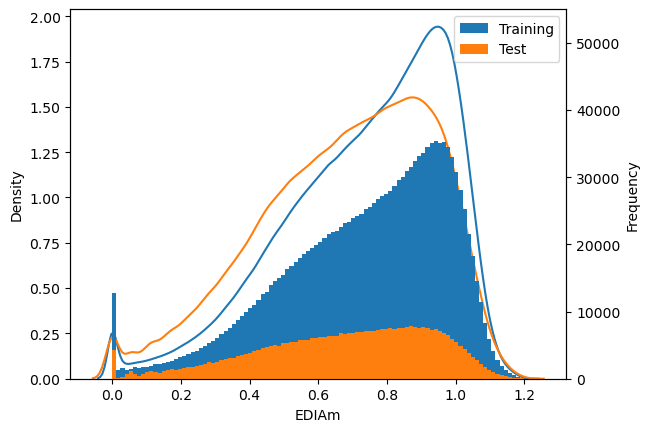

In [71]:
# Try plot values for subset of local metrics.
fig, ax = plt.subplots()
train_data = train_All_dict['EDIAm']
test_data = test_All_dict['EDIAm']
key='EDIAm'
# seaborn RDF.
x_label = key
df_train = pd.DataFrame(train_data, columns=[x_label])
df_test = pd.DataFrame(test_data, columns=[x_label])
sns.kdeplot(df_train, x=x_label, label='Training')
sns.kdeplot(df_test, x=x_label, label='Test')

# histogram
ax2 = ax.twinx()
ax2.hist(train_data, bins=100, label='Training')
ax2.hist(test_data, bins=100, label='Test')
plt.legend()
# ax.set_title(key)
plt.xlabel(f'Local metric: {key}')
ax2.set_ylabel('Frequency')
ax2.set_ylim(0, 55000)
plt.savefig(f'figures/local_metrics/{key}_RDF.png')
plt.show()

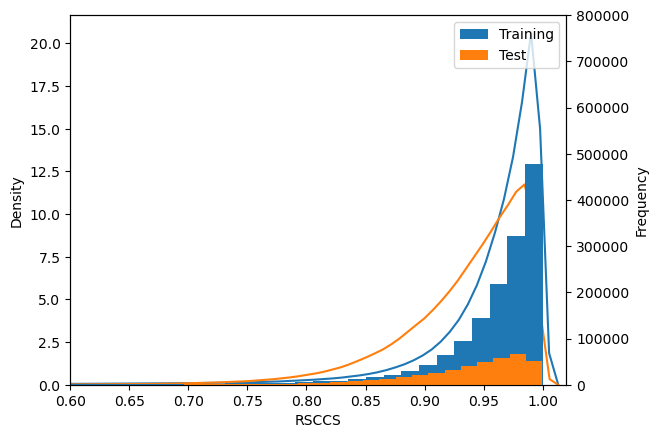

In [80]:
# Try plot values for subset of local metrics.
fig, ax = plt.subplots()
train_data = train_All_dict['RSCCS']
test_data = test_All_dict['RSCCS']
key='RSCCS'
# seaborn RDF.
x_label = key
df_train = pd.DataFrame(train_data, columns=[x_label])
df_test = pd.DataFrame(test_data, columns=[x_label])
sns.kdeplot(df_train, x=x_label, label='Training')
sns.kdeplot(df_test, x=x_label, label='Test')

# histogram
ax2 = ax.twinx()
ax2.hist(train_data, bins=100, label='Training')
ax2.hist(test_data, bins=100, label='Test')
plt.legend()
# ax.set_title(key)
plt.xlabel(f'Local metric: {key}')
ax2.set_ylabel('Frequency')
ax2.set_xlim(0.6, 1.02)
ax2.set_ylim(0, 800000)
plt.savefig(f'figures/local_metrics/{key}_RDF_positive.png')
plt.show()

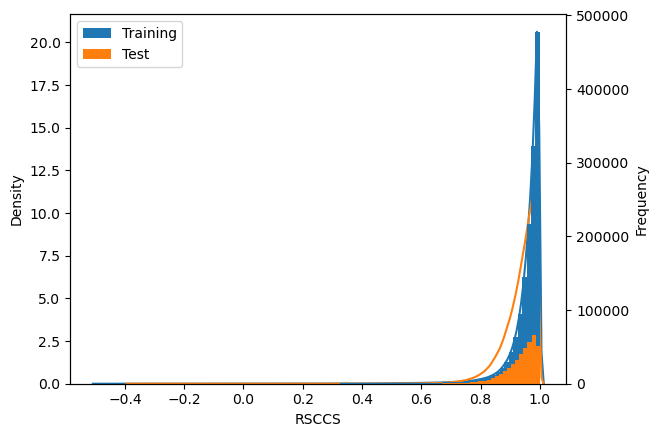

In [ ]:
# Try plot values for subset of local metrics.
fig, ax = plt.subplots()
train_data = train_All_dict['RSCCS']
test_data = test_All_dict['RSCCS']
key='RSCCS'
# seaborn RDF.
x_label = key
df_train = pd.DataFrame(train_data, columns=[x_label])
df_test = pd.DataFrame(test_data, columns=[x_label])
sns.kdeplot(df_train, x=x_label, label='Training')
sns.kdeplot(df_test, x=x_label, label='Test')

# histogram
ax2 = ax.twinx()
ax2.hist(train_data, bins=100, label='Training')
ax2.hist(test_data, bins=100, label='Test')
plt.legend()
# ax.set_title(key)
plt.xlabel(f'Local metric: {key}')
ax2.set_ylabel('Frequency')
# ax2.set_ylim(0, 55000)
plt.savefig(f'figures/local_metrics/{key}_RDF_negative.png')
plt.show()

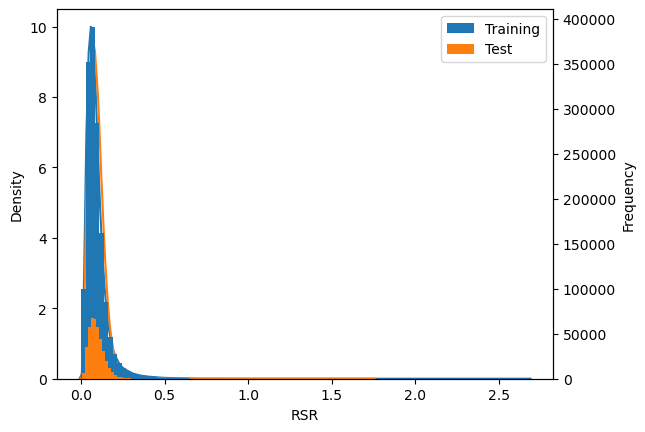

In [81]:
# Try plot values for subset of local metrics.
fig, ax = plt.subplots()
train_data = train_All_dict['RSR']
test_data = test_All_dict['RSR']
key='RSR'
# seaborn RDF.
x_label = key
df_train = pd.DataFrame(train_data, columns=[x_label])
df_test = pd.DataFrame(test_data, columns=[x_label])
sns.kdeplot(df_train, x=x_label, label='Training')
sns.kdeplot(df_test, x=x_label, label='Test')

# histogram
ax2 = ax.twinx()
ax2.hist(train_data, bins=100, label='Training')
ax2.hist(test_data, bins=100, label='Test')
plt.legend()
# ax.set_title(key)
plt.xlabel(f'Local metric: {key}')
ax2.set_ylabel('Frequency')
# ax2.set_ylim(0, 55000)
plt.savefig(f'figures/local_metrics/{key}_RDF.png')
plt.show()

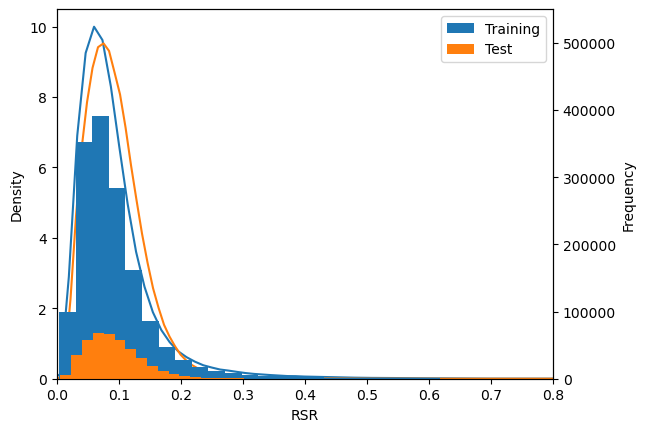

In [87]:
# Try plot values for subset of local metrics.
fig, ax = plt.subplots()
train_data = train_All_dict['RSR']
test_data = test_All_dict['RSR']
key='RSR'
# seaborn RDF.
x_label = key
df_train = pd.DataFrame(train_data, columns=[x_label])
df_test = pd.DataFrame(test_data, columns=[x_label])
sns.kdeplot(df_train, x=x_label, label='Training')
sns.kdeplot(df_test, x=x_label, label='Test')

# histogram
ax2 = ax.twinx()
ax2.hist(train_data, bins=100, label='Training')
ax2.hist(test_data, bins=100, label='Test')
plt.legend()
# ax.set_title(key)
plt.xlabel(f'Local metric: {key}')
ax2.set_ylabel('Frequency')
ax2.set_xlim(0, 0.8)
ax2.set_ylim(0, 550000)
plt.savefig(f'figures/local_metrics/{key}_RDF_zoomed.png')
plt.show()

Local metric:  EDIAm
Data loaded.


TypeError: list.count() takes exactly one argument (0 given)

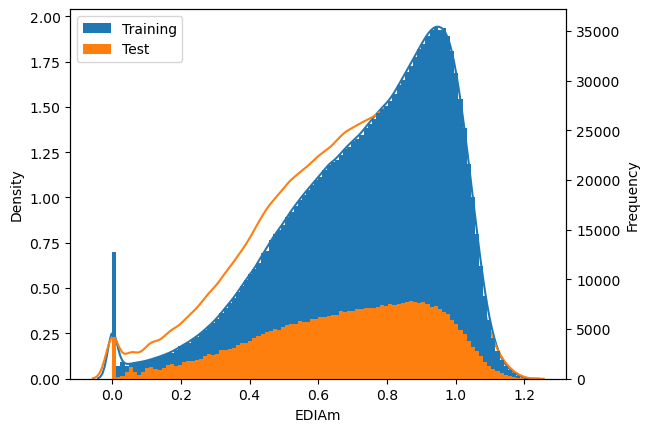

In [64]:
# Try plot values for each type of local metrics.
fig, ax = plt.subplots()
for key in ['EDIAm','RSCCS', 'RSR']: # subset of local metrics.
    print('Local metric: ', key)
    train_data = [res[key] for structure in list_trains for res in structure if res['compID'] in ['HOH', 'WAT', 'H2O'] and res[key] is not None] # Only for water
    test_data = [res[key] for structure in list_tests for res in structure if res['compID'] in ['HOH', 'WAT', 'H2O'] and res[key] is not None] # Only for water
    if len(train_data) > 0 and len(test_data) > 0:
        print('Data loaded.')
    else:
        print('Data not loaded.')
        break
    # seaborn RDF.
    x_label = key
    df_train = pd.DataFrame(train_data, columns=[x_label])
    df_test = pd.DataFrame(test_data, columns=[x_label])
    sns.kdeplot(df_train, x=x_label, label='Training')
    sns.kdeplot(df_test, x=x_label, label='Test')

    ax2 = ax.twinx()
    ax2.hist(train_data, bins=100, label='Training')
    ax2.hist(test_data, bins=100, label='Test')
    plt.legend()
    # ax.set_title(key)
    plt.xlabel(f'Local metric: {key}')
    ax2.set_ylabel('Frequency')
    ax2.set_ylim(0, max(train_data.count()) * 1.3)
    plt.savefig(f'figures/local_metrics/{key}_RDF.png')
    plt.show()

Local metric:  EDIAm
Data loaded.


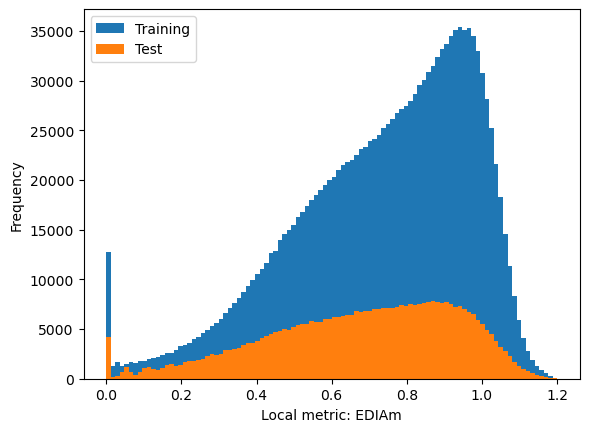

Local metric:  NGRID
Data loaded.


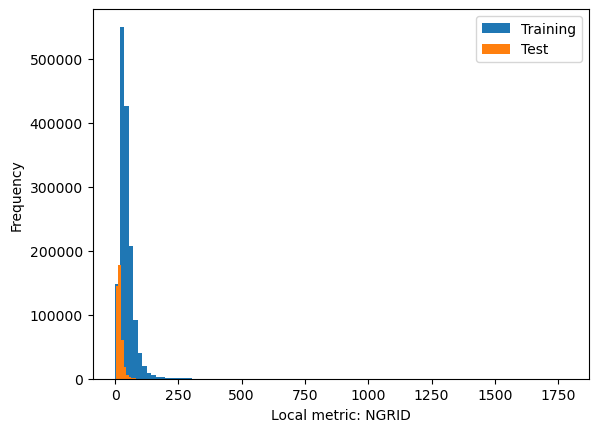

Local metric:  OPIA
Data loaded.


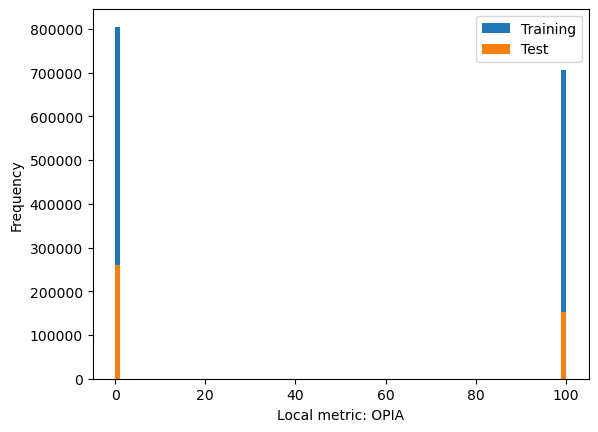

Local metric:  RSCCS
Data loaded.


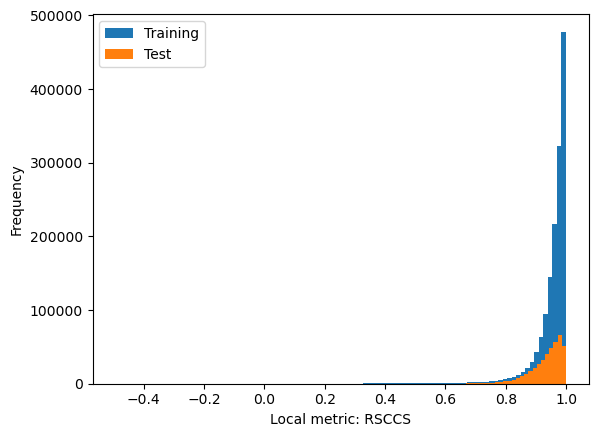

Local metric:  RSR
Data loaded.


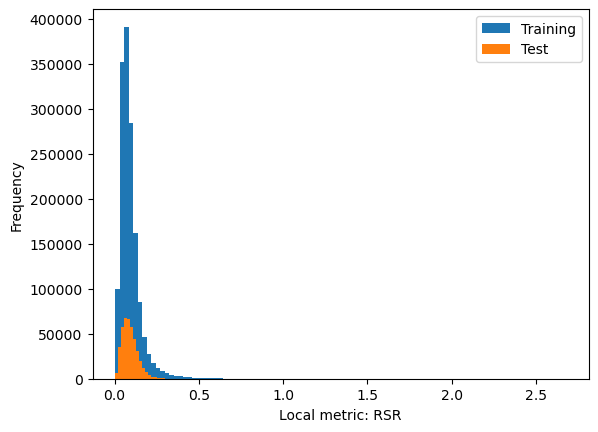

Local metric:  SRSR
Data loaded.


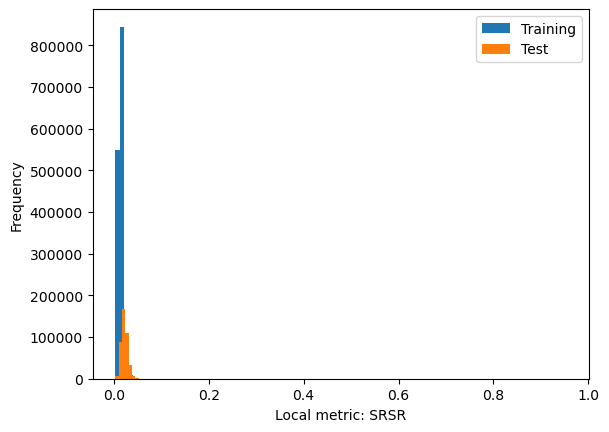

In [ ]:
# Try plot values for each type of local metrics.
fig, ax = plt.subplots()
for key in local_metric_keys:
    # train_data = [res[key] for structure in list_trains for res in structure if res['compID'] in ['HOH', 'WAT', 'H2O']] # Only for water
    # test_data = [res[key] for structure in list_tests for res in structure if res['compID'] in ['HOH', 'WAT', 'H2O']] # Only for water
    print('Local metric: ', key)
    train_data = [res[key] for structure in list_trains for res in structure if res['compID'] in ['HOH', 'WAT', 'H2O'] and res[key] is not None] # Only for water
    test_data = [res[key] for structure in list_tests for res in structure if res['compID'] in ['HOH', 'WAT', 'H2O'] and res[key] is not None] # Only for water
    if len(train_data) > 0 and len(test_data) > 0:
        print('Data loaded.')
    else:
        print('Data not loaded.')
        break
    # ax.hist(train_data, bins=100, label='Training')
    # ax.hist(test_data, bins=100, label='Test')
    # ax.legend()
    # # ax.set_title(key)
    # ax.set_xlabel(f'Local metric: {key}')
    # ax.set_ylabel('Frequency')

    plt.hist(train_data, bins=100, label='Training')
    plt.hist(test_data, bins=100, label='Test')
    plt.legend()
    # ax.set_title(key)
    plt.xlabel(f'Local metric: {key}')
    plt.ylabel('Frequency')
    plt.savefig(f'figures/local_metrics/{key}.png')
    plt.show()

In [ ]:
# Only for RSCC and EDIA.